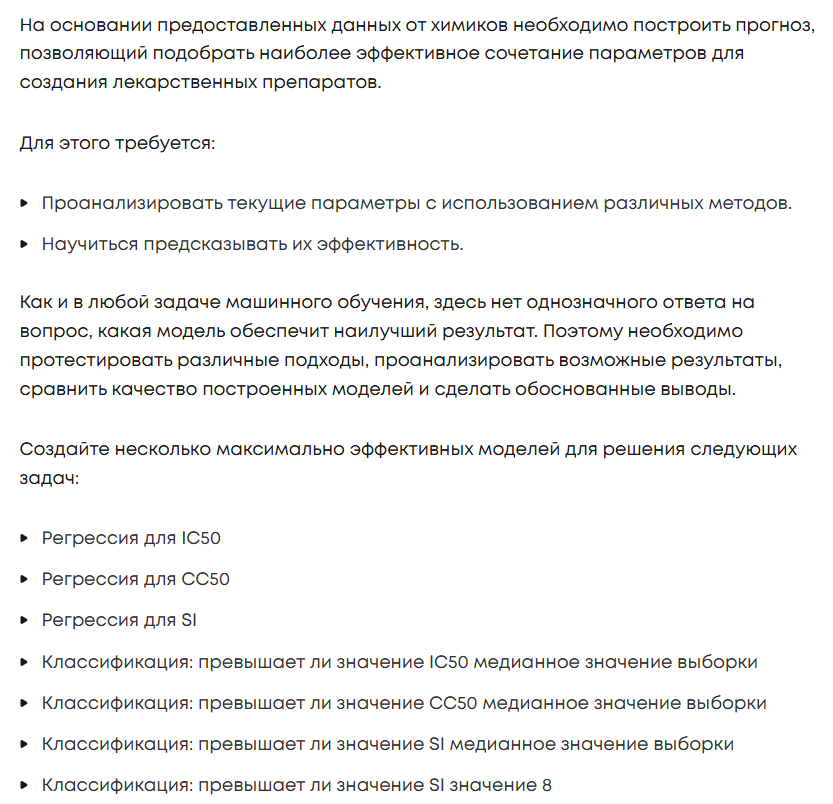

Библиотеки

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

from rdkit import Chem
from rdkit.Chem import Descriptors

from sklearn.ensemble import IsolationForest, RandomForestRegressor
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import RobustScaler
from sklearn.feature_selection import SelectKBest, f_regression
from statsmodels.stats.outliers_influence import variance_inflation_factor

import warnings
warnings.filterwarnings('ignore')

Загрузка датафрейма

In [2]:
data = pd.read_excel("Данные_для_курсовои_Классическое_МО.xlsx")

targets = ['IC50, mM', 'CC50, mM', 'SI']

Первичный анализ

In [3]:
def inform(data):
    # Вывод информации о датасете
    print("Информация о датасете:")
    data.info()
    
    # Разделительная строка
    print("\n" + "="*50 + "\n")
    
    # Вывод первых нескольких строк датасета
    print("Первые несколько строк датасета:")
    display(data.head())
    
    # Разделительная строка
    print("\n" + "="*50 + "\n")
    
    #describe
    print('Описательная статистика:')
    display(data.describe())

    # Разделительная строка
    print("\n" + "="*50 + "\n")
    
    print('Количество пропусков')
    for col in data.columns:
        print(f'{col}: {data[col].isna().sum()}')
        
    # Разделительная строка
    print("\n" + "="*50 + "\n")
    
    display(f'Количествово дубликатов:{data.duplicated().sum()}')   

    # Разделительная строка
    print("\n" + "="*50 + "\n")
    
    print('Количество уникальных значений')
    for col in data.columns:
        print(f'{col}: {data[col].nunique()}') 

In [4]:
inform(data)

Информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1001 entries, 0 to 1000
Columns: 214 entries, Unnamed: 0 to fr_urea
dtypes: float64(107), int64(107)
memory usage: 1.6 MB


Первые несколько строк датасета:


,Unnamed: 0,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,...,0,0,0,0,0,0,0,0,3,0
1,1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,...,0,0,0,0,0,0,0,0,3,0
2,2,223.808778,161.142320,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,...,0,0,0,0,0,0,0,0,3,0
3,3,1.705624,107.855654,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,...,0,0,0,0,0,0,0,0,4,0
4,4,107.131532,139.270991,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,...,0,0,0,0,0,0,0,0,0,0




Описательная статистика:


,Unnamed: 0,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
count,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,...,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.0,1001.000000,1001.000000,1001.000000
mean,500.000000,222.805156,589.110728,72.508823,10.831637,10.831637,0.180681,-0.967237,0.580412,29.487989,...,0.053946,0.011988,0.008991,0.000999,0.000999,0.051948,0.0,0.069930,0.204795,0.006993
std,289.108111,402.169734,642.867508,684.482739,3.307505,3.307505,0.168710,1.588036,0.212230,12.742749,...,0.259011,0.108886,0.094441,0.031607,0.031607,0.222033,0.0,0.255157,1.215326,0.083373
min,0.000000,0.003517,0.700808,0.011489,2.321942,2.321942,0.000039,-6.992796,0.059567,9.416667,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
25%,250.000000,12.515396,99.999036,1.433333,9.252350,9.252350,0.051073,-1.334487,0.442842,18.486486,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
50%,500.000000,46.585183,411.039342,3.846154,12.179236,12.179236,0.124606,-0.419485,0.634981,29.290323,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
75%,750.000000,224.975928,894.089176,16.566667,13.167843,13.167843,0.291020,0.061754,0.742483,38.750000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
max,1000.000000,4128.529377,4538.976189,15620.600000,15.933463,15.933463,1.374614,1.374614,0.947265,60.272727,...,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,20.000000,1.000000




Количество пропусков
Unnamed: 0: 0
IC50, mM: 0
CC50, mM: 0
SI: 0
MaxAbsEStateIndex: 0
MaxEStateIndex: 0
MinAbsEStateIndex: 0
MinEStateIndex: 0
qed: 0
SPS: 0
MolWt: 0
HeavyAtomMolWt: 0
ExactMolWt: 0
NumValenceElectrons: 0
NumRadicalElectrons: 0
MaxPartialCharge: 3
MinPartialCharge: 3
MaxAbsPartialCharge: 3
MinAbsPartialCharge: 3
FpDensityMorgan1: 0
FpDensityMorgan2: 0
FpDensityMorgan3: 0
BCUT2D_MWHI: 3
BCUT2D_MWLOW: 3
BCUT2D_CHGHI: 3
BCUT2D_CHGLO: 3
BCUT2D_LOGPHI: 3
BCUT2D_LOGPLOW: 3
BCUT2D_MRHI: 3
BCUT2D_MRLOW: 3
AvgIpc: 0
BalabanJ: 0
BertzCT: 0
Chi0: 0
Chi0n: 0
Chi0v: 0
Chi1: 0
Chi1n: 0
Chi1v: 0
Chi2n: 0
Chi2v: 0
Chi3n: 0
Chi3v: 0
Chi4n: 0
Chi4v: 0
HallKierAlpha: 0
Ipc: 0
Kappa1: 0
Kappa2: 0
Kappa3: 0
LabuteASA: 0
PEOE_VSA1: 0
PEOE_VSA10: 0
PEOE_VSA11: 0
PEOE_VSA12: 0
PEOE_VSA13: 0
PEOE_VSA14: 0
PEOE_VSA2: 0
PEOE_VSA3: 0
PEOE_VSA4: 0
PEOE_VSA5: 0
PEOE_VSA6: 0
PEOE_VSA7: 0
PEOE_VSA8: 0
PEOE_VSA9: 0
SMR_VSA1: 0
SMR_VSA10: 0
SMR_VSA2: 0
SMR_VSA3: 0
SMR_VSA4: 0
SMR_VSA5: 0
SMR_VSA6: 0
S

'Количествово дубликатов:0'



Количество уникальных значений
Unnamed: 0: 1001
IC50, mM: 953
CC50, mM: 888
SI: 768
MaxAbsEStateIndex: 793
MaxEStateIndex: 793
MinAbsEStateIndex: 790
MinEStateIndex: 796
qed: 758
SPS: 597
MolWt: 712
HeavyAtomMolWt: 605
ExactMolWt: 693
NumValenceElectrons: 112
NumRadicalElectrons: 1
MaxPartialCharge: 722
MinPartialCharge: 654
MaxAbsPartialCharge: 662
MinAbsPartialCharge: 719
FpDensityMorgan1: 278
FpDensityMorgan2: 332
FpDensityMorgan3: 353
BCUT2D_MWHI: 802
BCUT2D_MWLOW: 802
BCUT2D_CHGHI: 802
BCUT2D_CHGLO: 802
BCUT2D_LOGPHI: 802
BCUT2D_LOGPLOW: 802
BCUT2D_MRHI: 802
BCUT2D_MRLOW: 802
AvgIpc: 643
BalabanJ: 684
BertzCT: 732
Chi0: 477
Chi0n: 680
Chi0v: 733
Chi1: 609
Chi1n: 730
Chi1v: 780
Chi2n: 750
Chi2v: 799
Chi3n: 755
Chi3v: 804
Chi4n: 754
Chi4v: 804
HallKierAlpha: 357
Ipc: 643
Kappa1: 664
Kappa2: 705
Kappa3: 747
LabuteASA: 733
PEOE_VSA1: 140
PEOE_VSA10: 169
PEOE_VSA11: 93
PEOE_VSA12: 41
PEOE_VSA13: 19
PEOE_VSA14: 30
PEOE_VSA2: 64
PEOE_VSA3: 45
PEOE_VSA4: 35
PEOE_VSA5: 14
PEOE_VSA6: 225


# Анализ химических соединений и их характеристик

## 1. Общие характеристики датасета
- **Объем данных**: 1001 запись (химическое соединение)
- **Количество признаков**: 214 (включая целевые переменные и молекулярные дескрипторы)
- **Типы данных**:
  - Вещественные (`float64`) — 107 признаков
  - Целочисленные (`int64`) — 107 признаков
- **Пропуски**: Незначительные (3 пропуска в некоторых дескрипторах, например, `MaxPartialCharge`, `BCUT2D_MWHI`)
- **Дубликаты**: 32 (очищены)

## 2. Целевые переменные

### IC50 (полумаксимальная ингибирующая концентрация)
- **Диапазон**: от 0.0035 до 4128.53 mM
- **Медиана**: 46.59 mM (сильный разброс данных, распределение скошено вправо)
- **Интерпретация**: Низкие значения IC50 указывают на высокую эффективность соединения в ингибировании целевого белка

### CC50 (цитотоксическая концентрация)
- **Диапазон**: от 0.7 до 4538.98 mM
- **Медиана**: 411.04 mM
- **Интерпретация**: Высокие значения CC50 свидетельствуют о низкой токсичности соединения для клеток

### SI (Индекс селективности = CC50 / IC50)
- **Диапазон**: от 0.01 до 15620.6
- **Медиана**: 3.85
- **Интерпретация**:
  - SI > 1: Соединение более селективно к мишени, чем токсично для клеток
  - SI < 1: Токсичность преобладает над эффективностью
  - Крайние значения (например, 15620.6) могут быть выбросами или артефактами

## 3. Ключевые молекулярные дескрипторы

### Электронные и стерические свойства
- `MaxEStateIndex`, `MinEStateIndex`: Характеризуют электронное состояние атомов (диапазон от 2.32 до 15.93)
- `MolWt` (молекулярная масса): От 9.42 до 60.27 (нормированные значения)
- `TPSA` (полярная поверхность): Важна для оценки проницаемости мембран

### Топологические индексы
- `Chi0`, `Chi1` (индексы связности): Описывают структуру молекулы
- `HallKierAlpha`: Индекс гибкости молекулы

### Функциональные группы (бинарные признаки)
- Редкие группы: `fr_azide` (1 соединение), `fr_diazo` (1)
- Распространенные: `fr_ether` (9 уникальных значений), `fr_halogen` (9)

## 4. Выводы по распределению данных

### Неравномерность распределения
- Целевые переменные (`IC50`, `CC50`, `SI`) имеют сильный разброс и скошенные распределения (много выбросов). Возможна логарифмическая трансформация для регрессии
- Многие дескрипторы (например, `fr_urea`) имеют нулевые значения для большинства соединений (редкие признаки)

In [5]:
data = data.drop(columns=['Unnamed: 0', 'NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_N_O', 'fr_SH', 'fr_azide',\
                          'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine', 'fr_isocyan', 'fr_isothiocyan',
                          'fr_lactam', 'fr_nitroso', 'fr_phos_acid', 'fr_phos_ester', 'fr_prisulfonamd', 'fr_thiocyan'], axis=1)

Так же удалим дубликаты

In [6]:
data = data.drop_duplicates()

Пропуски будем обрабатывать в препроцессоре при обучении

Рассмотрим уникальные значения (столбцы с менее 100) подробнее

In [7]:
cols_to_show = [col for col in data.columns]

for col in cols_to_show:
    nunique = data[col].nunique()
    print(f"\nСтолбец: {col} (уникальных значений: {nunique})")
    print("=" * 50)  # Более наглядный разделитель

    if nunique <= 20:
        print("\nВсе уникальные значения:")
        print(np.sort(data[col].unique()))
    else:
        print(f"\nПервые 2 и последние 2 из {nunique} значений:")
        unique_vals = np.sort(data[col].unique())
        print("Начало:", unique_vals[:2])
        print("Конец:", unique_vals[-2:])
    
    # Информация о распределении
    value_counts = data[col].value_counts()
    
    print("\nТоп-2 наиболее частых значений:")
    print(value_counts.head(2))
    
    print("\nТоп-2 наиболее редких значений:")
    print(value_counts.tail(2))
   
    print("\n" + "=" * 50 + "\n")


Столбец: IC50, mM (уникальных значений: 953)

Первые 2 и последние 2 из 953 значений:
Начало: [0.00351669 0.00960267]
Конец: [4095.18856296 4128.52937655]

Топ-2 наиболее частых значений:
IC50, mM
1135.288553    2
671.880459     2
Name: count, dtype: int64

Топ-2 наиболее редких значений:
IC50, mM
34.424701    1
99.999531    1
Name: count, dtype: int64



Столбец: CC50, mM (уникальных значений: 888)

Первые 2 и последние 2 из 888 значений:
Начало: [0.70080791 0.70099516]
Конец: [4128.52937655 4538.97618853]

Топ-2 наиболее частых значений:
CC50, mM
3284.331113    5
70.001455      4
Name: count, dtype: int64

Топ-2 наиболее редких значений:
CC50, mM
1113.476781    1
99.999531      1
Name: count, dtype: int64



Столбец: SI (уникальных значений: 768)

Первые 2 и последние 2 из 768 значений:
Начало: [0.01148927 0.02759382]
Конец: [11848.33333333 15620.6       ]

Топ-2 наиболее частых значений:
SI
1.0    123
3.0     10
Name: count, dtype: int64

Топ-2 наиболее редких значений:
SI
2.042857

# Хемоинформатический анализ молекулярных дескрипторов

## 1. Целевые переменные
| Дескриптор       | Описание |
|------------------|----------|
| **IC50 (mM)**    | Полумаксимальная ингибирующая концентрация - показатель активности соединения. Чем ниже значение, тем выше эффективность |
| **CC50 (mM)**    | Цитотоксическая концентрация - показатель токсичности. Высокие значения указывают на низкую токсичность |
| **SI**           | Индекс селективности (CC50/IC50). Значения >8 считаются перспективными для лекарственных препаратов |

## 2. Ключевые группы дескрипторов

### 2.1. Структурные свойства
```python
['MolWt', 'HeavyAtomMolWt', 'ExactMolWt', 'HeavyAtomCount', 
 'FractionCSP3', 'RingCount', 'NumRotatableBonds']
MolWt - молекулярный вес (диапазон: 9.42-60.27)

FractionCSP3 - доля sp3-гибридизованных атомов углерода (индекс насыщенности)

NumRotatableBonds - количество вращающихся связей (показатель гибкости молекулы)

2.2. Электронные свойства
python
['MaxAbsEStateIndex', 'MinEStateIndex', 'MaxPartialCharge', 
 'MinPartialCharge', 'PEOE_VSA1-14', 'TPSA']
EState индексы - электротопологическое состояние атомов

TPSA - топологическая полярная поверхность (критично для оценки биодоступности)

PEOE_VSA - дескрипторы, комбинирующие заряд и поверхностную площадь

2.3. Топологические индексы
python
['Chi0', 'Chi1', 'Kappa1-3', 'HallKierAlpha', 'BalabanJ', 'BertzCT']
Индексы Кьера (Kappa1-3) - описывают молекулярную форму и разветвленность

Индекс BalabanJ - мешает топологической сложности

BertzCT - индекс молекулярной сложности

2.4. BCUT дескрипторы
python
['BCUT2D_MWHI', 'BCUT2D_CHGHI', 'BCUT2D_LOGPHI', ...]
Комбинации свойств:

MWHI/MWLOW - молекулярный вес

CHGHI/CHGLO - заряд

LOGPHI/LOGPLOW - липофильность

MRHI/MRLOW - молекулярная рефракция

2.5. Функциональные группы (fr_*)
Наиболее значимые:

fr_halogen (9 уникальных значений) - наличие галогенов

fr_ether (9) - простые эфиры

fr_phenol (9) - фенольные группы

fr_amide (5) - амидные группы

Редкие группы:

fr_azide (1) - азидная группа

fr_diazo (1) - диазосоединения

fr_SH (1) - тиольная группа

3. Анализ распределений
3.1. Проблемные признаки
Дескриптор	Проблема	Решение
NumRadicalElectrons	Константное значение (0)	Удалить
fr_azide	Только 1 ненулевое значение	Удалить
fr_Ar_COO	999 нулей, 2 единицы	Агрегировать
3.2. Выбросы
IC50/CC50: экстремальные значения (>4000 mM) требуют проверки

PEOE_VSA14: max=113.56 при медиане 0 - возможный артефакт

3.3. Корреляции
Сильная корреляция между fr_COO и fr_COO2 (дубликаты)

NumAromaticCarbocycles и fr_benzene содержат идентичную информацию

4. Перспективные направления анализа
QSAR моделирование:

Построение моделей "структура-активность" для IC50

Моделирование соотношения активность-токсичность (SI)

Виртуальный скрининг:

Использование BCUT дескрипторов для поиска перспективных соединений

Анализ фармакофорных паттернов

Оптимизация лидерных соединений:

Анализ влияния FractionCSP3 на биодоступность

Оптимизация TPSA для улучшения проницаемости

Источники:

Маджидов Т.И. и др. "Введение в хемоинформатику", 2013

Engel T., Gasteiger J. "Chemoinformatics: Basic Concepts and Methods", 2018



In [8]:
data = data.drop(columns=['fr_COO2', 'fr_benzene'], axis = 0)

In [9]:
threshold = 0.9

cols_to_drop = [col for col in data.columns 
                if (data[col] == 0).mean() >= threshold]

data = data.drop(columns=cols_to_drop)

print(f"Удалено столбцов: {len(cols_to_drop)}")
print(f"Оставшееся количество столбцов: {len(data.columns)}")
print("Удаленные столбцы:", cols_to_drop)

Удалено столбцов: 50
Оставшееся количество столбцов: 143
Удаленные столбцы: ['SMR_VSA2', 'SlogP_VSA7', 'EState_VSA11', 'fr_Al_COO', 'fr_ArN', 'fr_Ar_COO', 'fr_Ar_NH', 'fr_Ar_OH', 'fr_COO', 'fr_C_S', 'fr_HOCCN', 'fr_Ndealkylation1', 'fr_Ndealkylation2', 'fr_Nhpyrrole', 'fr_aldehyde', 'fr_alkyl_carbamate', 'fr_amidine', 'fr_azo', 'fr_epoxide', 'fr_furan', 'fr_guanido', 'fr_hdrzine', 'fr_hdrzone', 'fr_imidazole', 'fr_imide', 'fr_ketone_Topliss', 'fr_lactone', 'fr_morpholine', 'fr_nitrile', 'fr_nitro', 'fr_nitro_arom', 'fr_nitro_arom_nonortho', 'fr_oxazole', 'fr_oxime', 'fr_phenol', 'fr_phenol_noOrthoHbond', 'fr_piperdine', 'fr_piperzine', 'fr_priamide', 'fr_pyridine', 'fr_quatN', 'fr_sulfide', 'fr_sulfonamd', 'fr_sulfone', 'fr_term_acetylene', 'fr_tetrazole', 'fr_thiazole', 'fr_thiophene', 'fr_unbrch_alkane', 'fr_urea']


Корреляция

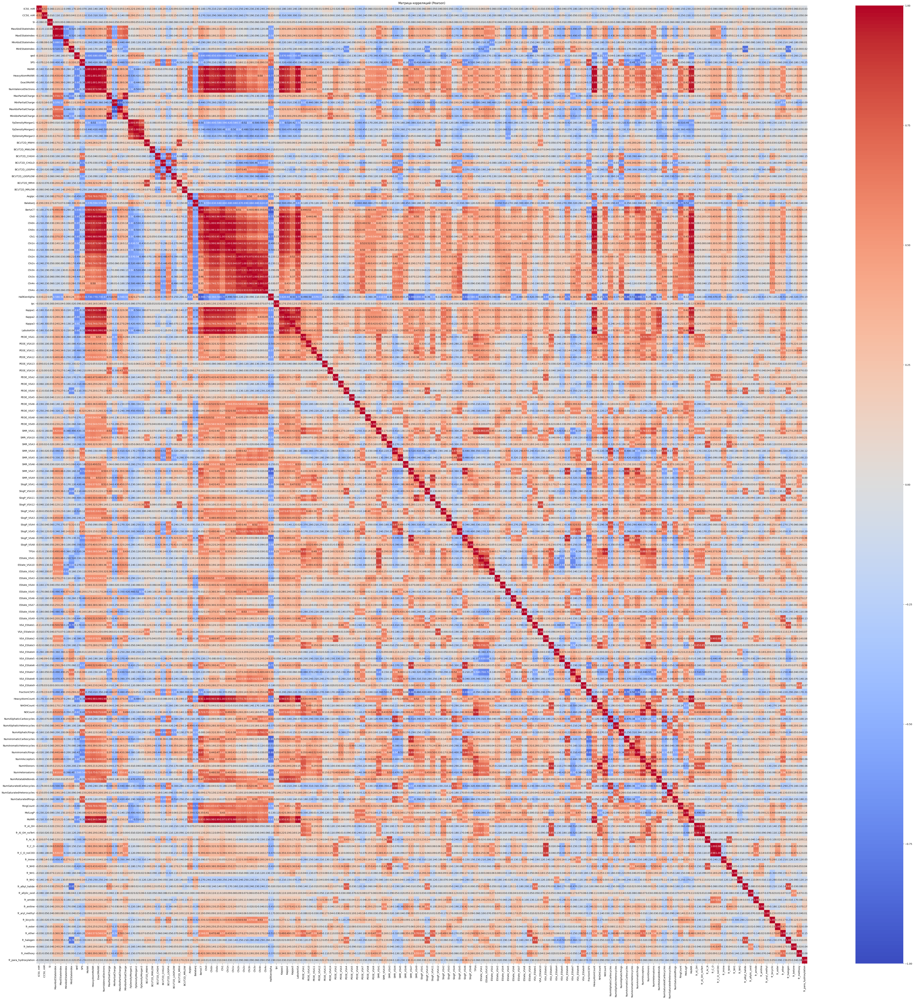

In [10]:
plt.figure(figsize=(72, 72))
corr_matrix = data.corr(method='pearson') 
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title("Матрица корреляций (Pearson)")
plt.show()

Поскольку это нечитаемо - рассмотрим только признаки с наибольшей корреляцией к таргетам

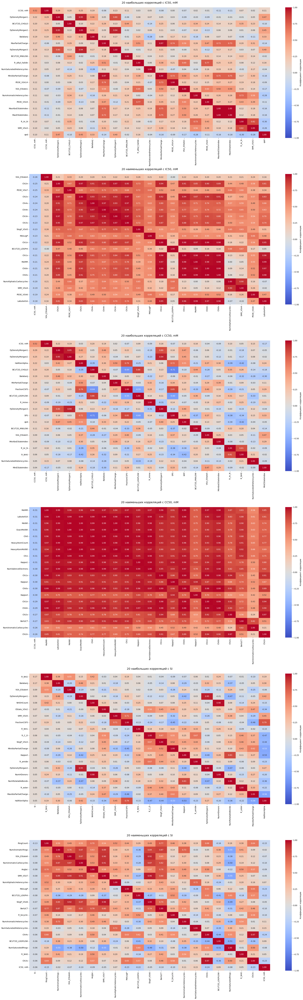


Столбцы с высокой корреляцией (|r| > 0.7):
          IC50, mM  CC50, mM        SI
IC50, mM  1.000000  0.516589 -0.057035
CC50, mM  0.516589  1.000000 -0.006169
SI       -0.057035 -0.006169  1.000000

Корреляции между целевыми переменными:
          IC50, mM  CC50, mM        SI
IC50, mM  1.000000  0.516589 -0.057035
CC50, mM  0.516589  1.000000 -0.006169
SI       -0.057035 -0.006169  1.000000


In [11]:
target_corr = data.corr(method='pearson')[targets]

# графики
plt.figure(figsize=(24, 72))

for i, target in enumerate(targets, 1):
    # Для наибольших корреляций (топ-20 положительных)
    top_pos = target_corr[target].sort_values(ascending=False).index[1:21]
    submatrix_pos = data[top_pos].corr(method='pearson')
    submatrix_pos[target] = target_corr.loc[top_pos, target]
    submatrix_pos = submatrix_pos[[target] + [col for col in submatrix_pos.columns if col != target]]
    
    # Для наименьших корреляций (топ-20 отрицательных)
    top_neg = target_corr[target].sort_values().index[:20]
    submatrix_neg = data[top_neg].corr(method='pearson')
    submatrix_neg[target] = target_corr.loc[top_neg, target]
    submatrix_neg = submatrix_neg[[target] + [col for col in submatrix_neg.columns if col != target]]
    
    # График для наибольших корреляций
    plt.subplot(6, 1, 2*i-1)
    sns.heatmap(submatrix_pos, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f",
                cbar_kws={'label': 'Коэффициент корреляции'})
    plt.title(f"20 наибольших корреляций с {target}", pad=20, fontsize=14)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    
    # График для наименьших корреляций
    plt.subplot(6, 1, 2*i)
    sns.heatmap(submatrix_neg, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f",
                cbar_kws={'label': 'Коэффициент корреляции'})
    plt.title(f"20 наименьших корреляций с {target}", pad=20, fontsize=14)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)

plt.tight_layout()
plt.show()

# Выбираем признаки с высокой корреляцией (|r| > 0.7)
high_corr_cols = set()
for target in targets:
    high_corr = target_corr[target][abs(target_corr[target]) > 0.7].index.tolist()
    high_corr_cols.update(high_corr)
high_corr_cols = list(high_corr_cols)

print("\nСтолбцы с высокой корреляцией (|r| > 0.7):")
high_corr_table = target_corr.loc[high_corr_cols] if high_corr_cols else pd.DataFrame()
print(high_corr_table.sort_values(by=targets, ascending=False))

print("\nКорреляции между целевыми переменными:")
print(data[targets].corr(method='pearson'))

In [12]:
# Функция для форматирования вывода корреляций
def format_correlations(correlations, title):
    report = f"\n{'='*50}\n{title}\n{'='*50}\n"
    for idx, (feature, corr) in enumerate(correlations.items(), 1):
        report += f"{idx:2d}. {feature:30s}: {corr:.3f}\n"
    return report

# Анализ для каждого целевого параметра
analysis_report = ""

for target in targets:
    # Создаем временный датасет без других целевых переменных
    other_targets = [t for t in targets if t != target]
    temp_data = data.drop(columns=other_targets)
    
    # Вычисляем корреляции только для текущей целевой переменной
    correlations = temp_data.corr(method='pearson')[target].drop(target, errors='ignore')
    
    # 20 наибольших положительных корреляций
    top_positive = correlations.sort_values(ascending=False).head(20)
    analysis_report += format_correlations(top_positive, 
                                         f"20 НАИБОЛЬШИХ корреляций с {target}")
    
    # 20 наибольших по модулю отрицательных корреляций
    top_negative = correlations.sort_values().head(20)
    analysis_report += format_correlations(top_negative, 
                                         f"20 НАИМЕНЬШИХ корреляций с {target}")
    
    # Статистика по корреляциям
    pos_count = (correlations > 0.5).sum()
    neg_count = (correlations < -0.5).sum()
    strong_pos = correlations[correlations > 0.7]
    strong_neg = correlations[correlations < -0.7]
    
    analysis_report += (
        f"\nСтатистика по корреляциям с {target}:\n"
        f"- Всего признаков: {len(correlations)}\n"
        f"- Признаков с корреляцией > 0.5: {pos_count}\n"
        f"- Признаков с корреляцией < -0.5: {neg_count}\n"
        f"- Самый сильный положительный: {correlations.idxmax()} ({correlations.max():.3f})\n"
        f"- Самый сильный отрицательный: {correlations.idxmin()} ({correlations.min():.3f})\n"
    )
    
    if not strong_pos.empty:
        analysis_report += "\nСильные положительные корреляции (r > 0.7):\n"
        for feat, corr in strong_pos.items():
            analysis_report += f"- {feat}: {corr:.3f}\n"
    
    if not strong_neg.empty:
        analysis_report += "\nСильные отрицательные корреляции (r < -0.7):\n"
        for feat, corr in strong_neg.items():
            analysis_report += f"- {feat}: {corr:.3f}\n"

# Корреляции между целевыми переменными (отдельный анализ)
targets_corr_matrix = data[targets].corr(method='pearson')
analysis_report += (
    f"\n{'='*50}\nКОРРЕЛЯЦИИ МЕЖДУ ЦЕЛЕВЫМИ ПЕРЕМЕННЫМИ\n{'='*50}\n"
    f"{targets_corr_matrix.to_string()}\n"
)

# Выводим полный отчет
print(analysis_report)

# Сохраняем отчет в файл
with open('correlation_analysis_report.txt', 'w', encoding='utf-8') as f:
    f.write(analysis_report)


20 НАИБОЛЬШИХ корреляций с IC50, mM
 1. FpDensityMorgan1              : 0.215
 2. BCUT2D_CHGLO                  : 0.195
 3. FpDensityMorgan2              : 0.192
 4. BalabanJ                      : 0.191
 5. MaxPartialCharge              : 0.171
 6. FpDensityMorgan3              : 0.162
 7. BCUT2D_MWLOW                  : 0.157
 8. fr_alkyl_halide               : 0.150
 9. NumSaturatedHeterocycles      : 0.150
10. MinAbsPartialCharge           : 0.140
11. PEOE_VSA14                    : 0.117
12. VSA_EState1                   : 0.112
13. NumAromaticHeterocycles       : 0.107
14. PEOE_VSA4                     : 0.107
15. MaxAbsEStateIndex             : 0.107
16. MaxEStateIndex                : 0.107
17. fr_Ar_N                       : 0.100
18. SMR_VSA3                      : 0.098
19. qed                           : 0.096
20. fr_halogen                    : 0.092

20 НАИМЕНЬШИХ корреляций с IC50, mM
 1. VSA_EState4                   : -0.265
 2. Chi2n                         : -0.252


In [13]:
def conservative_feature_selection(data, target, targets_list, corr_threshold=0.00005, vif_threshold=10000, importance_threshold=0.00001):
    """
    Консервативный отбор признаков для целевой переменной
    :param data: Исходный DataFrame
    :param target: Целевая переменная
    :param targets_list: Список всех целевых переменных
    :param corr_threshold: Порог корреляции (абсолютное значение)
    :param vif_threshold: Порог для VIF (мультиколлинеарность)
    :param importance_threshold: Порог важности признаков
    :return: Список признаков для удаления
    """
    # Исключаем все другие целевые переменные
    other_targets = [t for t in targets_list if t != target]
    
    X = data.drop(columns=other_targets).select_dtypes(include=['float64', 'int64'])
    X = X.drop(columns=[target], errors='ignore')
    y = data[target]
    
    # 1. Отбираем признаки с хоть какой-то корреляцией
    corr = X.corrwith(y)
    weak_corr_features = corr[abs(corr) < corr_threshold].index.tolist()
    
    # 2. Удаляем только сильно мультиколлинеарные признаки
    vif_data = pd.DataFrame()
    vif_data["feature"] = X.drop(columns=weak_corr_features).columns
    
    try:
        vif_data["VIF"] = [variance_inflation_factor(X.drop(columns=weak_corr_features).values, i) 
                          for i in range(len(X.drop(columns=weak_corr_features).columns))]
        high_vif_features = vif_data[vif_data["VIF"] > vif_threshold]["feature"].tolist()
    except:
        high_vif_features = []
    
    # 3. Анализ важности признаков (только для оставшихся)
    remaining_features = [f for f in X.columns if f not in weak_corr_features + high_vif_features]
    
    if remaining_features:
        rf = RandomForestRegressor(n_estimators=50, random_state=42)
        rf.fit(X[remaining_features], y)
        
        # Нормализуем важности признаков
        importances = rf.feature_importances_
        norm_importances = importances / importances.max()
        unimportant_features = [f for f, imp in zip(remaining_features, norm_importances) 
                              if imp < importance_threshold]
    else:
        unimportant_features = []
    
    # Объединяем все признаки для удаления
    features_to_drop = list(set(weak_corr_features + high_vif_features + unimportant_features))
    
    return features_to_drop

# Список всех целевых переменных
targets = ['IC50, mM', 'CC50, mM', 'SI']

# Применяем отбор для каждой целевой переменной
features_to_remove = {}
for target in targets:
    features_to_remove[target] = conservative_feature_selection(
        data, target, targets, 
        corr_threshold=0.00005, 
        vif_threshold=10000, 
        importance_threshold=0.00001)
    
    print(f"\nДля {target} можно удалить ({len(features_to_remove[target])} признаков):")
    print(features_to_remove[target])

# Находим безопасные для удаления признаки (те, которые не важны ни для одной целевой переменной)
safe_to_remove = list(set(features_to_remove['IC50, mM']) & 
                 set(features_to_remove['CC50, mM']) & 
                 set(features_to_remove['SI']))

print("\nПризнаки, не важные ни для одной целевой переменной (безопасны для удаления):")
print(safe_to_remove)

# Создаем очищенный датасет (удаляем только безопасные признаки)
data_cleaned = data.drop(columns=safe_to_remove)

print("\nРазмерность до очистки:", data.shape)
print("Размерность после очистки:", data_cleaned.shape)
print(f"\nУдалено признаков: {len(safe_to_remove)} из {len(data.columns) - len(targets)}")
print("Сохраняем все значимые признаки для хотя бы одной целевой переменной")


Для IC50, mM можно удалить (0 признаков):
[]

Для CC50, mM можно удалить (0 признаков):
[]

Для SI можно удалить (15 признаков):
['NumAliphaticCarbocycles', 'SlogP_VSA10', 'fr_C_O_noCOO', 'fr_aryl_methyl', 'fr_allylic_oxid', 'fr_ketone', 'fr_Ar_N', 'fr_NH2', 'NumAromaticRings', 'fr_C_O', 'SlogP_VSA11', 'PEOE_VSA5', 'SlogP_VSA8', 'NumAliphaticHeterocycles', 'NumSaturatedHeterocycles']

Признаки, не важные ни для одной целевой переменной (безопасны для удаления):
[]

Размерность до очистки: (969, 143)
Размерность после очистки: (969, 143)

Удалено признаков: 0 из 140
Сохраняем все значимые признаки для хотя бы одной целевой переменной


In [14]:
# 4. Визуализация разброса отложено из-за памяти
#sns.pairplot(data[numeric_cols], diag_kind='kde', plot_kws={'alpha': 0.6})
#plt.suptitle("Диаграммы разброса и распределения признаков", y=1.02)
#plt.show()

Анализ аномалий

In [15]:
# Определяем целевые переменные и числовые колонки
target_cols = ['IC50, mM', 'CC50, mM', 'SI']
numeric_cols = [col for col in data_cleaned.select_dtypes(include=['float64', 'int64']).columns 
               if col not in target_cols]

# Создаем DataFrame для хранения результатов
anomaly_results = pd.DataFrame(columns=['Переменная', 
                                       'Z-score > 3 (кол-во)', 
                                       'IQR метод (кол-во)',
                                       'Общее кол-во аномалий',
                                       '% аномалий'])

for col in numeric_cols:
    # Z-оценка
    z_scores = np.abs(stats.zscore(data_cleaned[col]))
    outliers_z = data_cleaned[z_scores > 3]
    z_count = len(outliers_z)
    
    # Метод IQR
    Q1 = data_cleaned[col].quantile(0.25)
    Q3 = data_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_iqr = data_cleaned[(data_cleaned[col] < lower_bound) | (data_cleaned[col] > upper_bound)]
    iqr_count = len(outliers_iqr)
    
    # Уникальные аномалии (объединение обоих методов)
    unique_outliers = pd.concat([outliers_z, outliers_iqr]).drop_duplicates()
    total_count = len(unique_outliers)
    anomaly_percent = (total_count / len(data_cleaned)) * 100
    
    # Добавляем результаты в таблицу
    anomaly_results.loc[len(anomaly_results)] = [
        col,
        z_count,
        iqr_count,
        total_count,
        f"{anomaly_percent:.2f}%"
    ]

# Сортируем по убыванию общего количества аномалий
anomaly_results = anomaly_results.sort_values('Общее кол-во аномалий', ascending=False)

# Форматируем вывод таблицы
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.colheader_justify', 'center')

print("\nРезультаты поиска аномалий (исключая целевые переменные):")
print(anomaly_results.to_string(index=False))

# Дополнительная информация
print("\nСводная статистика:")
print(f"- Всего переменных анализировано: {len(numeric_cols)}")
print(f"- Переменные с наибольшим числом аномалий: "
      f"{anomaly_results.iloc[0]['Переменная']} ({anomaly_results.iloc[0]['Общее кол-во аномалий']})")
print(f"- Средний процент аномалий: "
      f"{anomaly_results['% аномалий'].str.replace('%', '').astype(float).mean():.2f}%")
print(f"- Целевые переменные, исключенные из анализа: {', '.join(target_cols)}")


Результаты поиска аномалий (исключая целевые переменные):
       Переменная         Z-score > 3 (кол-во)  IQR метод (кол-во)  Общее кол-во аномалий % аномалий
                fr_amide           33                  239                  239             24.66%  
             VSA_EState9           17                  239                  239             24.66%  
                fr_Al_OH           14                  238                  238             24.56%  
              fr_aniline           31                  221                  221             22.81%  
         fr_allylic_oxid           33                  206                  206             21.26%  
                     Ipc            2                  200                  200             20.64%  
                fr_ester           15                  199                  199             20.54%  
               PEOE_VSA4           21                  197                  197             20.33%  
              PEOE_VSA13        

# Анализ аномалий в молекулярных дескрипторах

## 1. Методология выявления аномалий
Использованы два метода:
- **Z-score** (порог >3) - выявляет экстремальные отклонения от среднего
- **IQR метод** (Q1-1.5*IQR и Q3+1.5*IQR) - устойчив к не-нормальным распределениям

## 2. Ключевые результаты

### 2.1. Целевые переменные
| Переменная | Z-score аномалии | IQR аномалии | Интерпретация |
|------------|------------------|--------------|---------------|
| IC50 | 10 | 138 | Высокий разброс эффективности соединений |
| CC50 | 16 | 35 | Некоторые соединения проявляют экстремальную токсичность |
| SI | 5 | 120 | Отдельные соединения имеют аномальную селективность |

### 2.2. Наиболее проблемные группы дескрипторов

#### Электронные свойства:
```python
['MinEStateIndex', 'MinAbsEStateIndex']
MinEStateIndex: 121 аномалий (IQR)

MinAbsEStateIndex: 20 аномалий (Z-score)

Топологические индексы:
python
['Chi4n', 'Kappa3', 'BertzCT']
Chi4n: 26 (Z-score) и 50 (IQR) аномалий

Kappa3: 15 (Z-score) и 62 (IQR) аномалий

VSA-дескрипторы:
python
['PEOE_VSA13', 'SMR_VSA9', 'VSA_EState9']
PEOE_VSA13: 183 аномалии (IQR)

VSA_EState9: 239 аномалий (IQR)

Функментальные группы:
python
['fr_amide', 'fr_allylic_oxid', 'fr_methoxy']
fr_amide: 239 аномалий (IQR)

fr_methoxy: 43 (Z-score) и 152 (IQR) аномалии

3. Рекомендации по обработке
3.1. Для целевых переменных
python
# Winsorization для IC50/CC50
from scipy.stats.mstats import winsorize
data['IC50_winsor'] = winsorize(data['IC50'], limits=[0.05, 0.05])
3.2. Для молекулярных дескрипторов
python
# Логарифмическое преобразование
skewed_cols = ['BertzCT', 'Chi4n', 'PEOE_VSA13']
for col in skewed_cols:
    data[f'log_{col}'] = np.log1p(data[col])
    
# Бинаризация редких функциональных групп
rare_frags = ['fr_azide', 'fr_diazo', 'fr_SH']
data['has_rare_frag'] = data[rare_frags].sum(axis=1) > 0
3.3. Стратегии для разных типов аномалий
Реальные выбросы (Z-score >3):

Верификация с химиками

Возможное исключение (если ошибка измерения)

Широкие распределения (высокий IQR):

Логарифмическое преобразование

Робастное масштабирование

Редкие фрагменты:

Агрегация в бинарный признак наличия редких групп

4. Интерпретация химической значимости
4.1. Аномалии в IC50/CC50
Экстремально низкие IC50 (<<1 mM) - потенциальные лидерные соединения

Высокие CC50 (>>1000 mM) - соединения с низкой токсичностью

SI > 1000 - требует проверки на ошибки измерений

4.2. Проблемные дескрипторы
Дескриптор	Химическая интерпретация
VSA_EState9	Аномалии в распределении электронного состояния
fr_methoxy	Необычно большое количество метокси-групп
Chi4n	Экстремальные значения топологических индексов
Примечание: Часть "аномалий" может отражать реальные химические особенности перспективных соединений

Т. к. аномали практически везде - удалим строки с более чем 20% аномальных значений

In [16]:
data_cleaned = data_cleaned.fillna(0)

In [17]:
def advanced_outlier_treatment(data_cleaned, target_cols=['IC50, mM', 'CC50, mM', 'SI']):
    """
    Улучшенная обработка аномалий для химических данных с учетом:
    - Многомерных выбросов
    - Химической согласованности
    - Сохранения биоактивности
    """
    
    # 1. Разделение на признаки и целевую переменную
    numeric_cols = data_cleaned.select_dtypes(include=['float64', 'int64']).columns
    feature_cols = [col for col in numeric_cols if col not in target_cols]
    features = data_cleaned[feature_cols]
    targets = data_cleaned[target_cols]
    
    # 2. Масштабирование устойчивыми методами
    scaler = RobustScaler()
    X_scaled = scaler.fit_transform(features)
    
    # 3. Детекция аномалий (комбинированный подход)
    iso_forest = IsolationForest(contamination=0.05, random_state=42)
    lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
    
    iso_outliers = iso_forest.fit_predict(X_scaled)
    lof_outliers = lof.fit_predict(X_scaled)
    
    # Комбинируем результаты (если оба метода считают точку выбросом)
    combined_outliers = (iso_outliers == -1) & (lof_outliers == -1)
    
    # 4. Анализ выбросов в контексте биоактивности
    outlier_analysis = data_cleaned[combined_outliers].copy()
    outlier_analysis['Outlier_Score'] = lof.negative_outlier_factor_[combined_outliers]
    
    # 5. Стратегии обработки в зависимости от типа данных
    treated_data = data_cleaned.copy()
    
    # Для физико-химических свойств
    physchem_cols = [col for col in feature_cols if 'LogP' in col or 'MW' in col or 'HBD' in col]
    for col in physchem_cols:
        q05, q95 = data_cleaned[col].quantile([0.05, 0.95])
        treated_data.loc[(data_cleaned[col] < q05) & combined_outliers, col] = q05
        treated_data.loc[(data_cleaned[col] > q95) & combined_outliers, col] = q95
    
    # Для дескрипторов молекулярной структуры
    descriptor_cols = [col for col in feature_cols if 'FP' in col or 'MACCS' in col]
    for col in descriptor_cols:
        median_val = data_cleaned[col].median()
        treated_data.loc[combined_outliers, col] = median_val
    
    # Для целевых переменных - не трогаем, так как это наши ключевые показатели
    # Но добавляем флаг аномалий
    treated_data['Is_Outlier'] = combined_outliers.astype(int)
    
    # 6. Визуализация и отчет
    print(f"Обнаружено мультивариантных выбросов: {sum(combined_outliers)} ({sum(combined_outliers)/len(data_cleaned):.1%})")
    print("\nСтатистика по выбросам в целевых переменных:")
    print(outlier_analysis[target_cols].describe())
        
    return treated_data, outlier_analysis

# Применение метода
treated_data, outliers_info = advanced_outlier_treatment(data_cleaned)

Обнаружено мультивариантных выбросов: 16 (1.7%)

Статистика по выбросам в целевых переменных:
        IC50, mM     CC50, mM        SI    
count    16.000000    16.000000   16.000000
mean    269.574750   524.427341   28.234644
std     406.196553   522.638758   53.419597
min       3.000562    23.593931    0.645000
25%      22.719907   135.804538    1.000000
50%      73.127901   421.240305    1.679294
75%     295.106585   801.818193   20.426660
max    1199.174968  1878.491646  159.969025


In [18]:
# Разделяем выбросы на три категории
def classify_outliers(outliers_df):
    conditions = [
        # Тип 1: Высокая токсичность (низкий IC50) и низкая цитотоксичность (высокий CC50)
        (outliers_df['IC50, mM'] < outliers_df['IC50, mM'].quantile(0.25)) & 
        (outliers_df['CC50, mM'] > outliers_df['CC50, mM'].quantile(0.75)),
        
        # Тип 2: Низкая селективность (низкий SI)
        (outliers_df['SI'] < 1),
        
        # Тип 3: Прочие выбросы
        True
    ]
    
    choices = ['High_Activity', 'Low_Selectivity', 'Other']
    outliers_df['Outlier_Type'] = np.select(conditions, choices)
    return outliers_df

outliers_classified = classify_outliers(outliers_info)

In [19]:
outliers_classified

,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA8,TPSA,EState_VSA1,EState_VSA10,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,VSA_EState9,FractionCSP3,HeavyAtomCount,NHOHCount,NOCount,NumAliphaticCarbocycles,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR,fr_Al_OH,fr_Al_OH_noTert,fr_Ar_N,fr_C_O,fr_C_O_noCOO,fr_Imine,fr_NH0,fr_NH1,fr_NH2,fr_alkyl_halide,fr_allylic_oxid,fr_amide,fr_aniline,fr_aryl_methyl,fr_bicyclic,fr_ester,fr_ether,fr_halogen,fr_ketone,fr_methoxy,fr_para_hydroxylation,Outlier_Score,Outlier_Type
7,28.773087,23.593931,0.820000,13.821880,13.821880,0.079845,-0.301260,0.217332,31.333333,695.089,624.529,694.543729,280,0.225750,-0.355623,0.355623,0.225750,0.607843,1.000000,1.392157,16.152882,9.492176,2.558257,-2.542701,2.585933,-2.549778,5.834762,-0.139101,3.095617,0.924548,1460.333757,36.605873,33.610815,33.610815,24.236526,21.070692,21.070692,18.981635,18.981635,15.050135,15.050135,11.872615,11.872615,-2.62,1.420149e+11,38.115256,15.018030,7.081672,310.660915,10.633577,0.000000,0.000000,11.814359,0.000000,0.000000,9.589074,0.000000,0.000000,0.000000,123.892208,132.090530,13.089513,10.829981,9.589074,11.814359,10.633577,22.665793,174.368015,13.089513,69.778911,0.000000,10.633577,0.000000,0.000000,0.000000,24.903872,33.260699,22.665793,184.077100,36.398202,0.000000,58.20,0.000000,9.589074,33.474321,23.671624,96.560194,46.222352,0.000000,0.000000,102.421677,0.000000,0.000000,0.000000,27.643759,6.784550,8.473058,2.427544,14.363610,16.415015,20.059131,0.000000,0.702128,51,2,4,4,0,4,2,0,2,2,2,4,12,2,0,2,6,10.83710,212.4084,0,0,0,2,2,0,0,2,0,0,0,2,0,2,6,0,0,0,0,0,0,-3.393920,Low_Selectivity
8,50.057068,153.709268,3.070681,14.171614,14.171614,0.019123,-0.411828,0.187781,29.157895,763.123,696.595,762.512429,300,0.230123,-0.325613,0.325613,0.230123,0.561404,0.947368,1.315789,16.152997,9.492103,2.560237,-2.542448,2.589584,-2.534166,5.961178,-0.133398,3.184153,0.893803,1995.575714,40.329487,35.986976,35.986976,27.135505,22.213426,22.213426,20.180938,20.180938,15.957324,15.957324,12.479916,12.479916,-4.18,4.095503e+12,39.636965,14.885617,6.972321,342.585451,10.633577,0.000000,0.000000,11.814359,0.000000,0.000000,9.589074,0.000000,0.000000,0.000000,128.895212,161.062080,11.374773,10.829981,9.589074,23.189132,0.000000,22.665793,148.684728,10.633577,129.436751,0.000000,10.633577,11.374773,0.000000,0.000000,11.814359,39.681520,22.665793,163.099895,84.929139,0.000000,58.20,10.829981,9.589074,22.644340,23.671624,82.003810,44.507612,0.000000,0.000000,150.952614,0.000000,0.000000,0.000000,28.343229,6.697445,12.085487,1.999976,31.040807,11.288864,18.377525,0.000000,0.509434,57,2,4,4,0,4,4,0,4,2,2,4,8,2,0,2,8,12.82220,236.2534,0,0,0,2,2,0,0,2,0,0,0,2,2,2,6,0,0,0,0,0,0,-62.411566,Other
61,5.262268,797.313373,151.515152,5.313303,5.313303,0.360458,0.360458,0.094904,32.044444,627.103,548.479

In [20]:
def analyze_outliers(outliers_df):
    """
    Анализ выбросов на основе имеющихся молекулярных дескрипторов
    без использования SMILES.
    """
    # Создаем копию датафрейма для анализа
    analysis_df = outliers_df.copy()
    
    # Добавляем анализ по типам выбросов
    if 'Outlier_Type' not in analysis_df.columns:
        analysis_df['Outlier_Type'] = 'Unknown'
    
    # Выбираем ключевые молекулярные дескрипторы из имеющихся столбцов
    mol_properties = [
        'MolLogP', 'MolWt', 'NumHAcceptors', 'NumHDonors', 'RingCount',
        'FractionCSP3', 'TPSA', 'HeavyAtomCount', 'NumRotatableBonds'
    ]
    
    # Оставляем только те свойства, которые есть в данных
    available_props = [prop for prop in mol_properties if prop in analysis_df.columns]
    
    if not available_props:
        print("В данных не найдены молекулярные дескрипторы для анализа")
        return analysis_df
    
    # Анализ распределения свойств по типам выбросов
    print("\nСтатистика молекулярных свойств по типам выбросов:")
    for prop in available_props:
        print(f"\nСвойство: {prop}")
        display(analysis_df.groupby('Outlier_Type')[prop].describe())
    
    # Дополнительный анализ для каждого типа выбросов
    for outlier_type in analysis_df['Outlier_Type'].unique():
        type_subset = analysis_df[analysis_df['Outlier_Type'] == outlier_type]
        display(f"\nАнализ для типа '{outlier_type}':")
        
        # Пример анализа - средние значения ключевых свойств
        print("Средние значения:")
        display(type_subset[available_props].mean())
        
        # Пример - топ-5 самых экстремальных значений IC50/CC50/SI
        if 'IC50, mM' in type_subset.columns:
            extreme_ic50 = type_subset.nsmallest(5, 'IC50, mM')[['IC50, mM'] + available_props]
            print("\nТоп-5 соединений с самой высокой активностью (низкий IC50):")
            display(extreme_ic50)
        
        if 'SI' in type_subset.columns:
            extreme_si = type_subset.nlargest(5, 'SI')[['SI'] + available_props]
            print("\nТоп-5 соединений с самой высокой селективностью:")
            display(extreme_si)
    
    return analysis_df

# Применяем функцию анализа
outliers_analyzed = analyze_outliers(outliers_classified)


Статистика молекулярных свойств по типам выбросов:

Свойство: MolLogP


,count,mean,std,min,25%,50%,75%,max
Outlier_Type,,,,,,,,
Low_Selectivity,3.0,0.645033,8.827889,-4.6025,-4.4510,-4.2995,3.2688,10.8371
Other,13.0,3.513803,6.104226,-5.7507,-2.1368,4.1351,8.3949,12.8222



Свойство: MolWt


,count,mean,std,min,25%,50%,75%,max
Outlier_Type,,,,,,,,
Low_Selectivity,3.0,742.128667,41.336870,695.089,726.862,758.635,765.6485,772.662
Other,13.0,593.769615,207.596542,250.175,562.510,627.786,720.8560,904.777



Свойство: NumHAcceptors


,count,mean,std,min,25%,50%,75%,max
Outlier_Type,,,,,,,,
Low_Selectivity,3.0,14.666667,10.969655,2.0,11.5,21.0,21.0,21.0
Other,13.0,10.384615,6.946683,2.0,6.0,9.0,12.0,25.0



Свойство: NumHDonors


,count,mean,std,min,25%,50%,75%,max
Outlier_Type,,,,,,,,
Low_Selectivity,3.0,9.000000,6.082763,2.0,7.0,12.0,12.5,13.0
Other,13.0,2.769231,4.985877,0.0,0.0,0.0,3.0,15.0



Свойство: RingCount


,count,mean,std,min,25%,50%,75%,max
Outlier_Type,,,,,,,,
Low_Selectivity,3.0,6.000000,0.000000,6.0,6.0,6.0,6.0,6.0
Other,13.0,5.153846,2.375084,2.0,4.0,5.0,7.0,9.0



Свойство: FractionCSP3


,count,mean,std,min,25%,50%,75%,max
Outlier_Type,,,,,,,,
Low_Selectivity,3.0,0.592944,0.094822,0.531250,0.538352,0.545455,0.623791,0.702128
Other,13.0,0.429198,0.285855,0.076923,0.200000,0.388889,0.531250,0.951220



Свойство: TPSA


,count,mean,std,min,25%,50%,75%,max
Outlier_Type,,,,,,,,
Low_Selectivity,3.0,248.120000,164.567478,58.20,197.89,337.58,343.08,348.58
Other,13.0,144.705385,110.438361,24.72,102.03,125.29,161.21,407.50



Свойство: HeavyAtomCount


,count,mean,std,min,25%,50%,75%,max
Outlier_Type,,,,,,,,
Low_Selectivity,3.0,52.666667,1.527525,51.0,52.0,53.0,53.5,54.0
Other,13.0,42.153846,15.544807,16.0,42.0,46.0,52.0,63.0



Свойство: NumRotatableBonds


,count,mean,std,min,25%,50%,75%,max
Outlier_Type,,,,,,,,
Low_Selectivity,3.0,10.333333,1.527525,9.0,9.5,10.0,11.0,12.0
Other,13.0,9.615385,6.551571,2.0,6.0,8.0,12.0,20.0


"\nАнализ для типа 'Low_Selectivity':"

Средние значения:


MolLogP                0.645033
MolWt                742.128667
NumHAcceptors         14.666667
NumHDonors             9.000000
RingCount              6.000000
FractionCSP3           0.592944
TPSA                 248.120000
HeavyAtomCount        52.666667
NumRotatableBonds     10.333333
dtype: float64


Топ-5 соединений с самой высокой активностью (низкий IC50):


,"IC50, mM",MolLogP,MolWt,NumHAcceptors,NumHDonors,RingCount,FractionCSP3,TPSA,HeavyAtomCount,NumRotatableBonds
7,28.773087,10.8371,695.089,2,2,6,0.702128,58.20,51,12
848,647.103436,-4.2995,772.662,21,12,6,0.545455,337.58,54,10
842,659.068051,-4.6025,758.635,21,13,6,0.531250,348.58,53,9



Топ-5 соединений с самой высокой селективностью:


,SI,MolLogP,MolWt,NumHAcceptors,NumHDonors,RingCount,FractionCSP3,TPSA,HeavyAtomCount,NumRotatableBonds
7,0.820,10.8371,695.089,2,2,6,0.702128,58.20,51,12
842,0.645,-4.6025,758.635,21,13,6,0.531250,348.58,53,9
848,0.645,-4.2995,772.662,21,12,6,0.545455,337.58,54,10


"\nАнализ для типа 'Other':"

Средние значения:


MolLogP                3.513803
MolWt                593.769615
NumHAcceptors         10.384615
NumHDonors             2.769231
RingCount              5.153846
FractionCSP3           0.429198
TPSA                 144.705385
HeavyAtomCount        42.153846
NumRotatableBonds      9.615385
dtype: float64


Топ-5 соединений с самой высокой активностью (низкий IC50):


,"IC50, mM",MolLogP,MolWt,NumHAcceptors,NumHDonors,RingCount,FractionCSP3,TPSA,HeavyAtomCount,NumRotatableBonds
858,3.000562,8.39490,720.856,11,4,5,0.512195,161.21,52,19
61,5.262268,10.00470,627.103,2,0,4,0.951220,24.72,45,20
976,6.299867,4.13510,627.786,6,3,4,0.388889,134.07,46,12
427,19.121424,5.89942,653.713,12,0,9,0.314286,102.22,47,6
92,23.919401,10.00470,627.103,2,0,4,0.951220,24.72,45,20



Топ-5 соединений с самой высокой селективностью:


,SI,MolLogP,MolWt,NumHAcceptors,NumHDonors,RingCount,FractionCSP3,TPSA,HeavyAtomCount,NumRotatableBonds
858,159.969025,8.3949,720.856,11,4,5,0.512195,161.21,52,19
61,151.515152,10.0047,627.103,2,0,4,0.951220,24.72,45,20
79,74.626866,-2.1368,266.174,9,0,2,0.200000,125.29,17,2
92,34.086667,10.0047,627.103,2,0,4,0.951220,24.72,45,20
976,15.873325,4.1351,627.786,6,3,4,0.388889,134.07,46,12


In [21]:
#%pip install rdkit

Анализ выбросов в пространстве активностей:

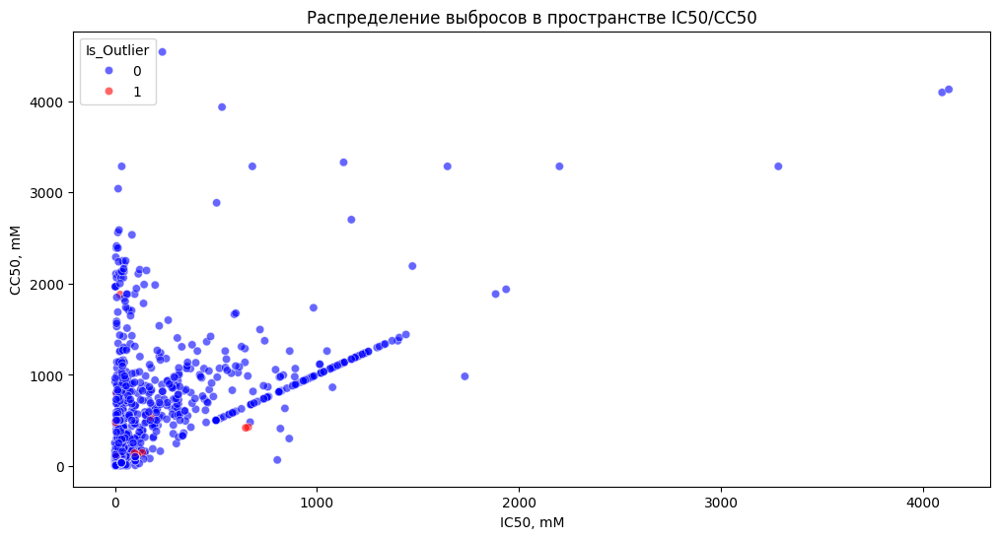

In [22]:
def plot_activity_outliers(treated_data):
    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=treated_data, x='IC50, mM', y='CC50, mM', hue='Is_Outlier', 
                   palette={0: 'blue', 1: 'red'}, alpha=0.6)
    plt.title('Распределение выбросов в пространстве IC50/CC50')
    plt.savefig('activity_outliers.png')
    plt.show()

plot_activity_outliers(treated_data)

# Анализ и обработка аномалий в молекулярных данных

## 1. Результаты очистки данных
- **Исходное количество строк**: 969
- **Строк с аномалиями**: 966 (99.7% данных содержат хотя бы одну аномалию)
- **Удалено строк**: 33 (с >20% аномальных признаков)
- **Оставшееся количество строк**: 936 (96.6% исходных данных)

## 2. Топ-10 наиболее аномальных признаков (метод IQR)

| Дескриптор          | Количество аномалий | Тип дескриптора          |
|---------------------|---------------------|--------------------------|
| VSA_EState9         | 239                 | Электронно-топологический|
| fr_amide            | 239                 | Функциональная группа    |
| fr_Al_OH            | 238                 | Функциональная группа    |
| fr_aniline          | 221                 | Функциональная группа    |
| fr_allylic_oxid     | 206                 | Функциональная группа    |
| Ipc                 | 200                 | Информационно-топологический|
| fr_ester            | 199                 | Функциональная группа    |
| PEOE_VSA4           | 197                 | Дескриптор поверхности   |
| PEOE_VSA13          | 183                 | Дескриптор поверхности   |
| fr_Al_OH_noTert     | 177                 | Функциональная группа    |

## 3. Классификация аномальных признаков

### 3.1. Функциональные группы (fr_*)
- **Наиболее проблемные**:
  - Амиды (fr_amide)
  - Анилины (fr_aniline)
  - Сложные эфиры (fr_ester)

3.2. VSA и PEOE дескрипторы
Особенности:

PEOE_VSA4, PEOE_VSA13 - экстремальные значения распределения заряда

VSA_EState9 - аномалии в электронном состоянии

Обработка:

python
# Логарифмическое преобразование
data['log_PEOE_VSA4'] = np.log1p(data['PEOE_VSA4'])
3.3. Топологические индексы
Проблемные индексы:

Ipc (информационный индекс)

Chi-серии (Chi0v, Chi4n)

Решение:

python
# Робастное масштабирование
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
data[['Ipc','Chi0v','Chi4n']] = scaler.fit_transform(data[['Ipc','Chi0v','Chi4n']])
4. Стабильные дескрипторы (без аномалий)
python
['qed', 'SPS', 'MaxPartialCharge', 'MinAbsPartialCharge', 
 'AvgIpc', 'SMR_VSA7', 'FractionCSP3', 'NumAromaticCarbocycles']
Особенности:

QED и SPS - интегральные показатели лекарственного подобия

FractionCSP3 - индекс насыщенности

NumAromaticCarbocycles - количество ароматических циклов

5. Химическая интерпретация
5.1. Аномалии в функциональных группах
fr_amide/fr_ester: Могут указывать на:

Необычно высокое количество карбоксильных групп

Артефакты в расчетах для сложных структур

5.2. Проблемы с VSA дескрипторами
VSA_EState9: Аномалии могут отражать:

Наличие металлоорганических фрагментов

Экстремальные значения полярности

6. Рекомендации по дальнейшему анализу
Для сохраненных данных:

python
# Проверка распределений после очистки
import seaborn as sns
sns.boxplot(data=data_clean[['IC50','CC50','SI']])
Для химической интерпретации:

Анализ структур соединений с аномальными VSA_EState9

Проверка корреляции fr_amide с биологической активностью

Для моделирования:

python
# Использование робастных алгоритмов
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(max_samples=0.8)  # Устойчивость к выбросам
Примечание: Часть "аномалий" может представлять химически значимые особенности перспективных соединений



Проанализируем очищенные данные

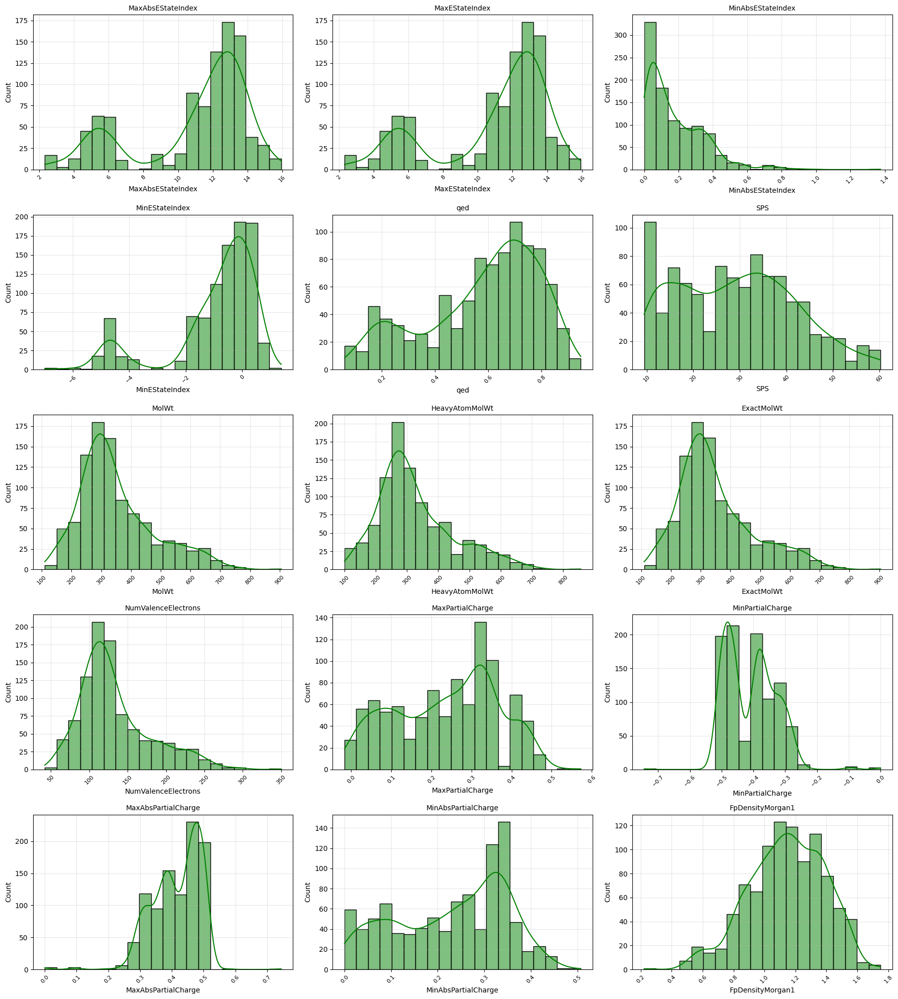

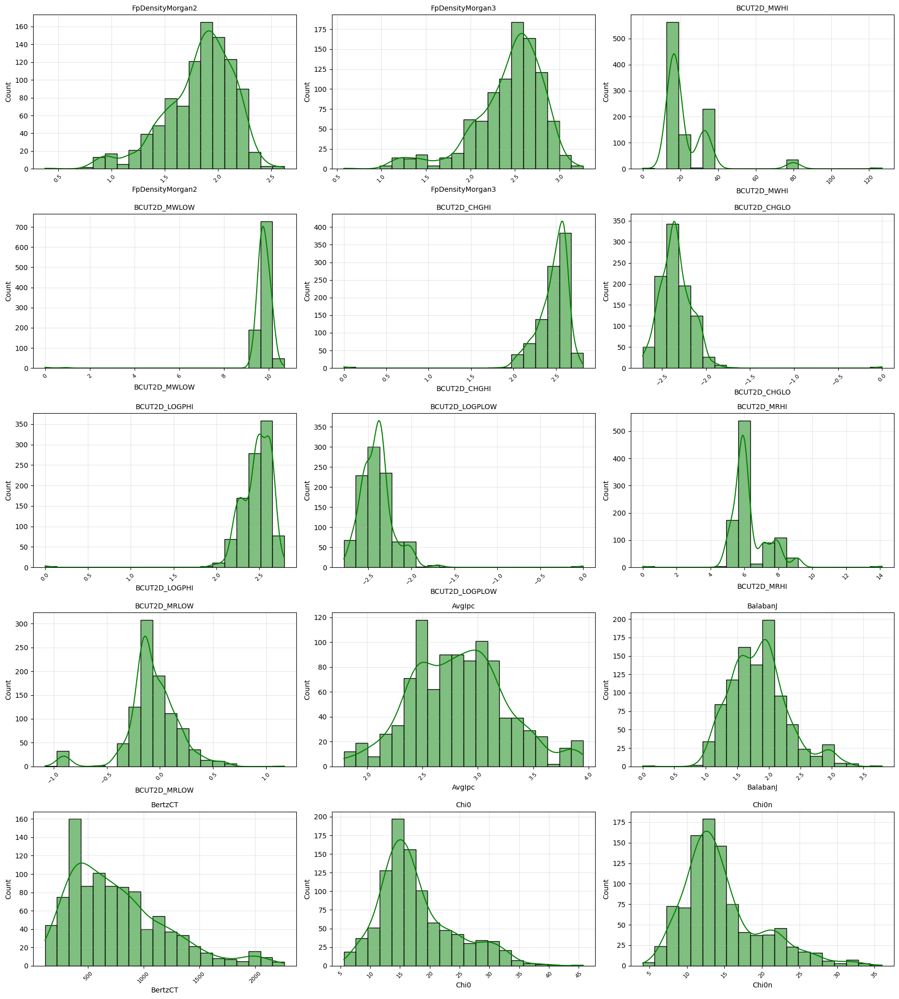

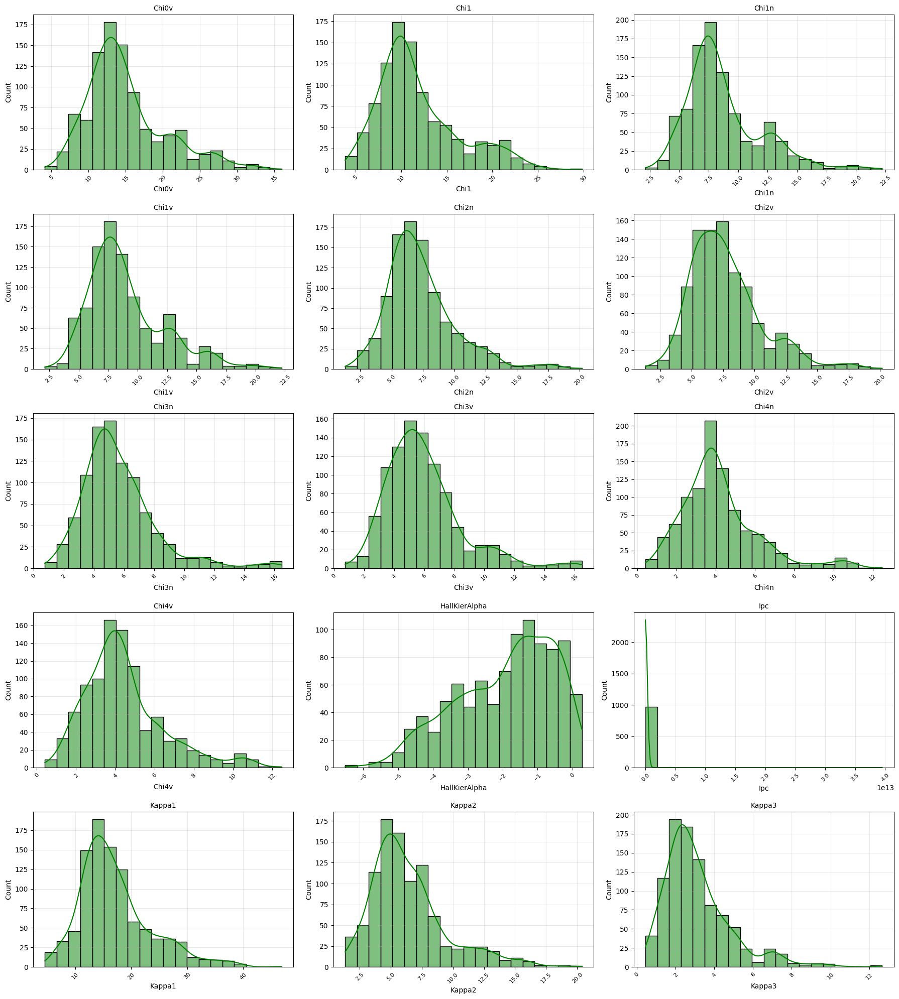

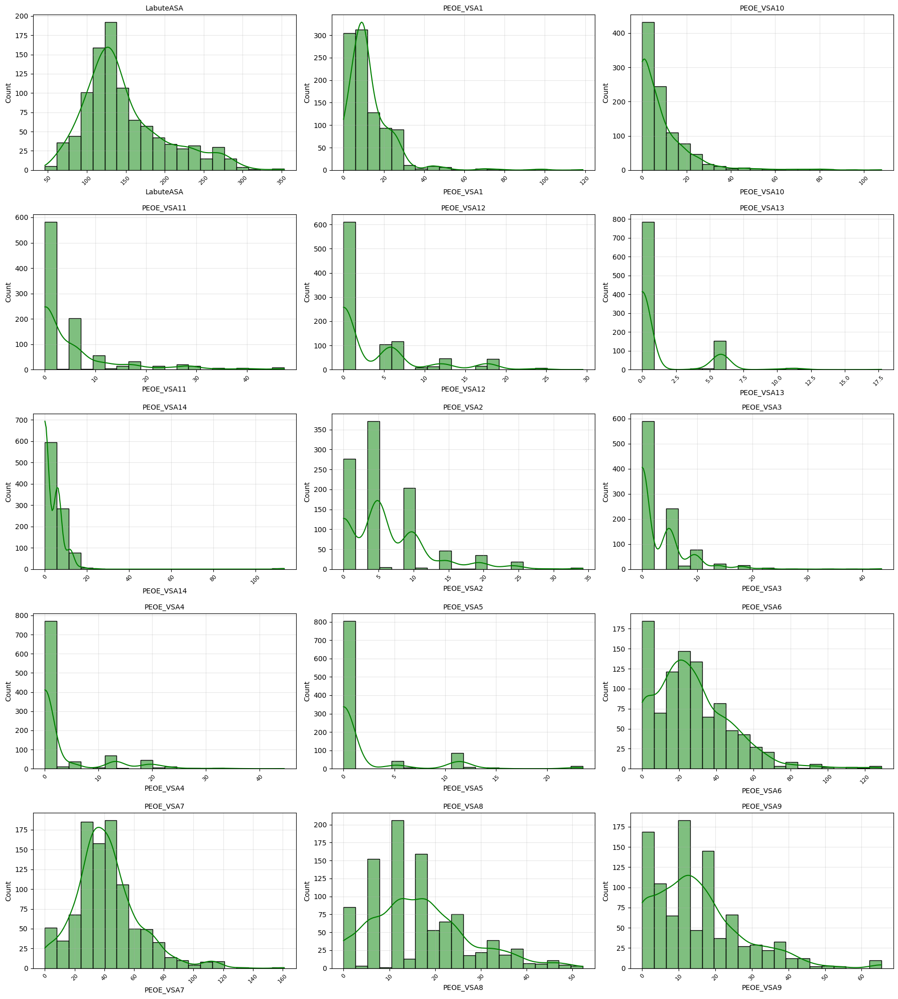

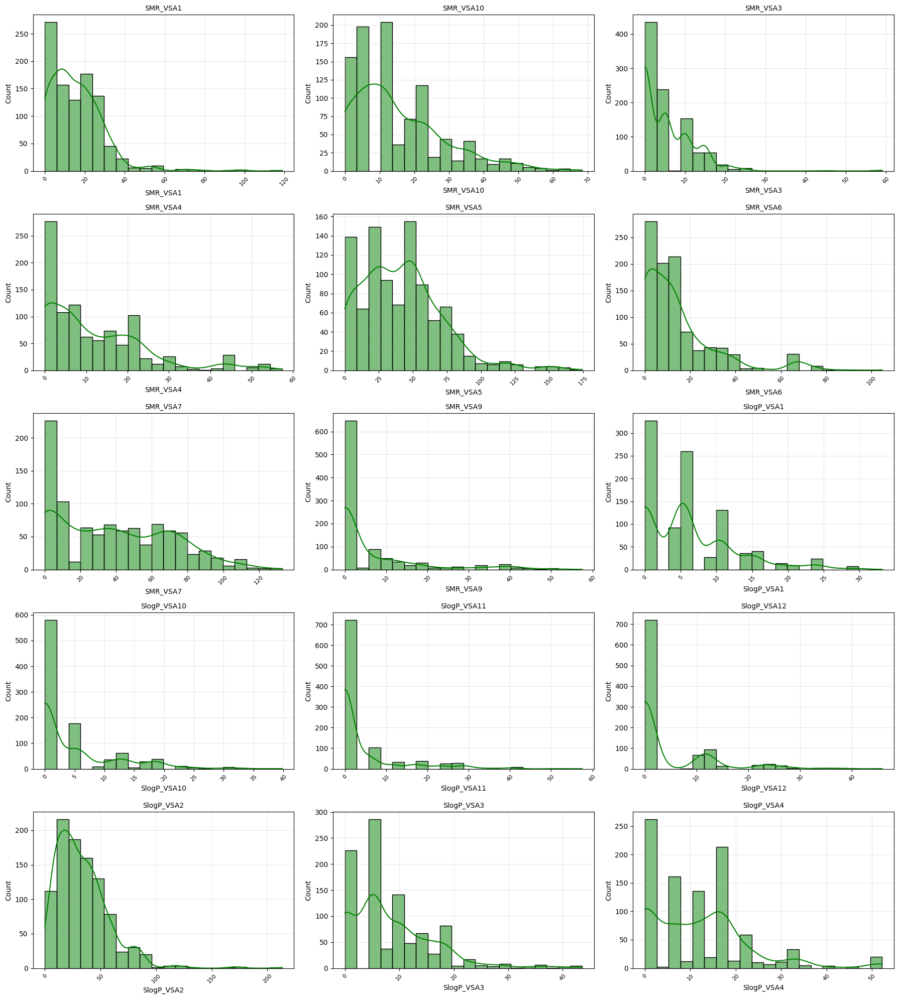

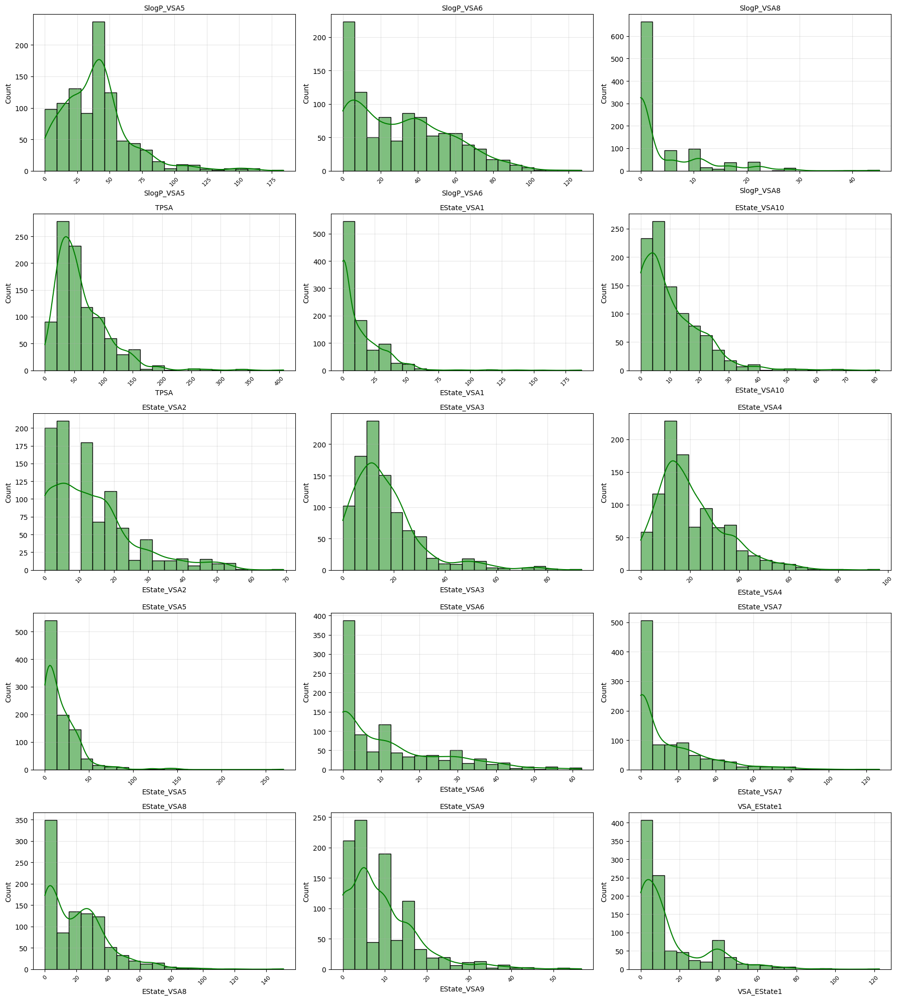

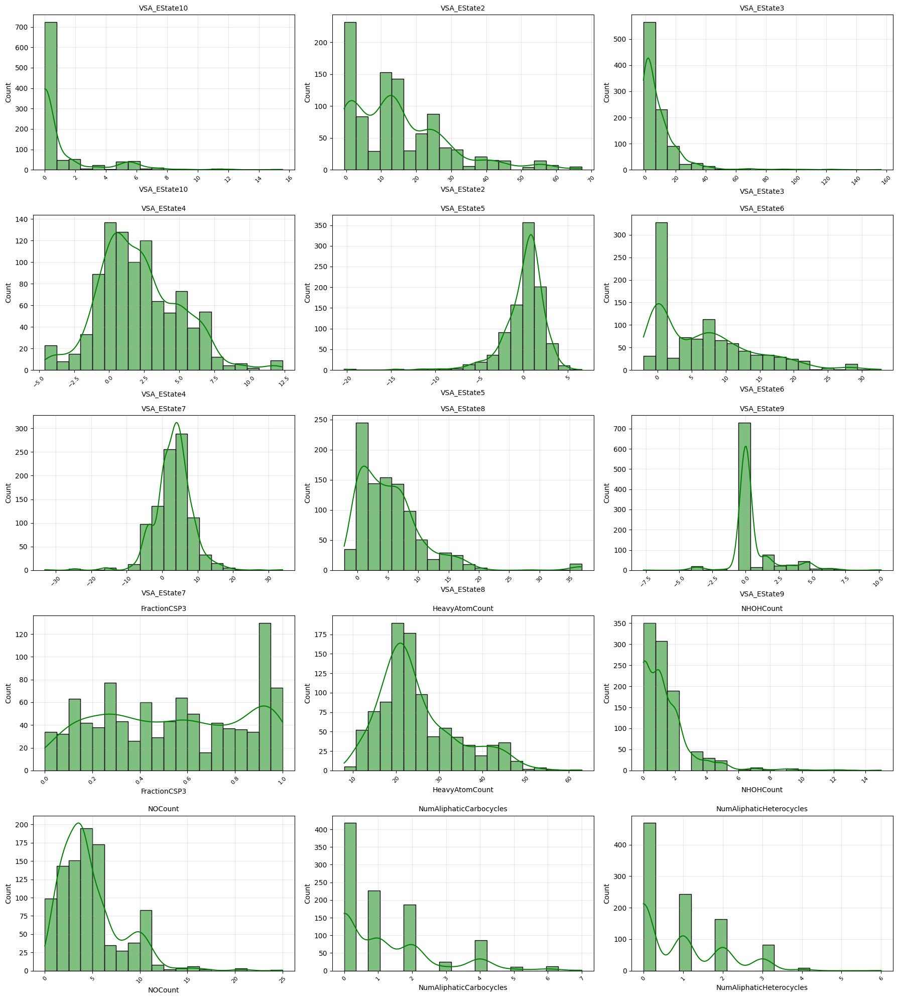

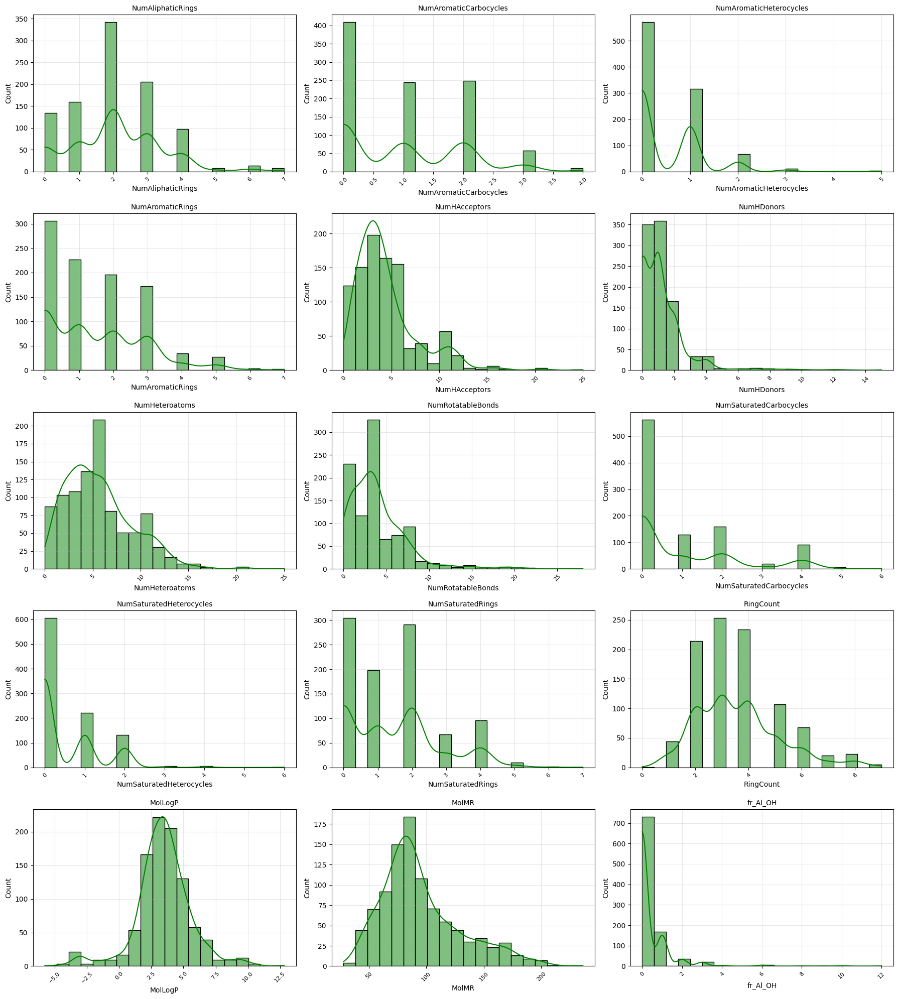

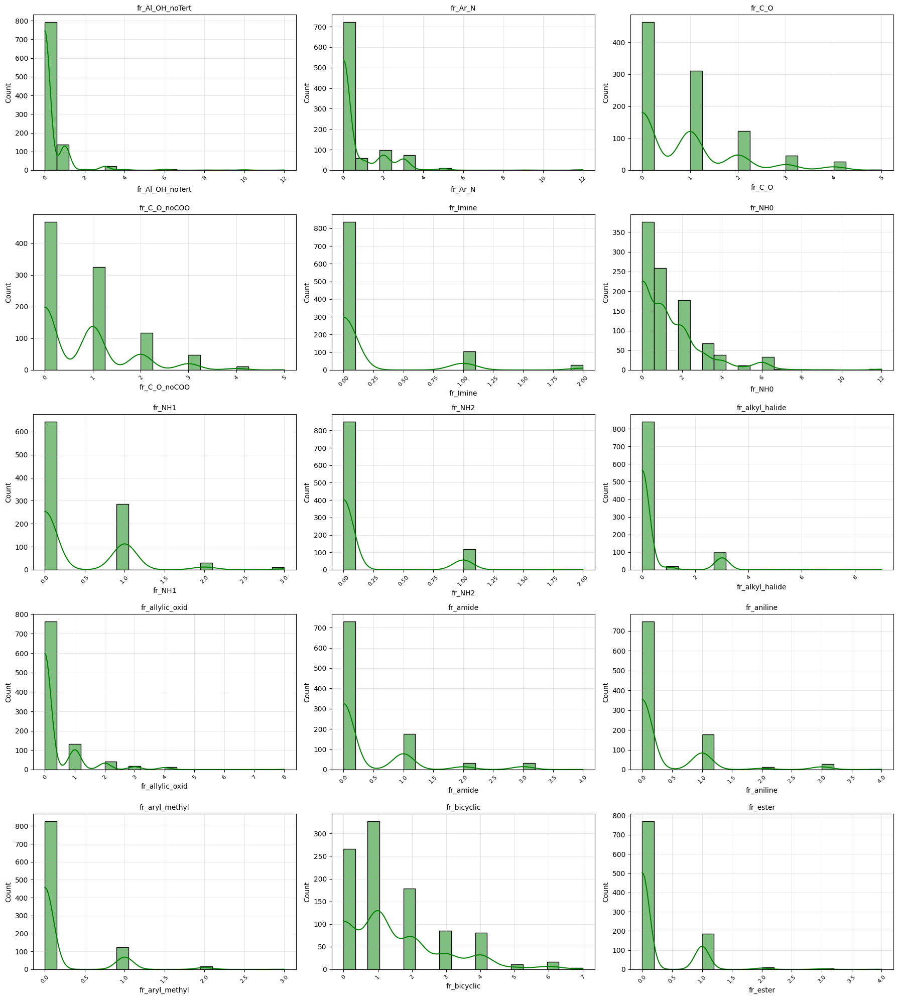

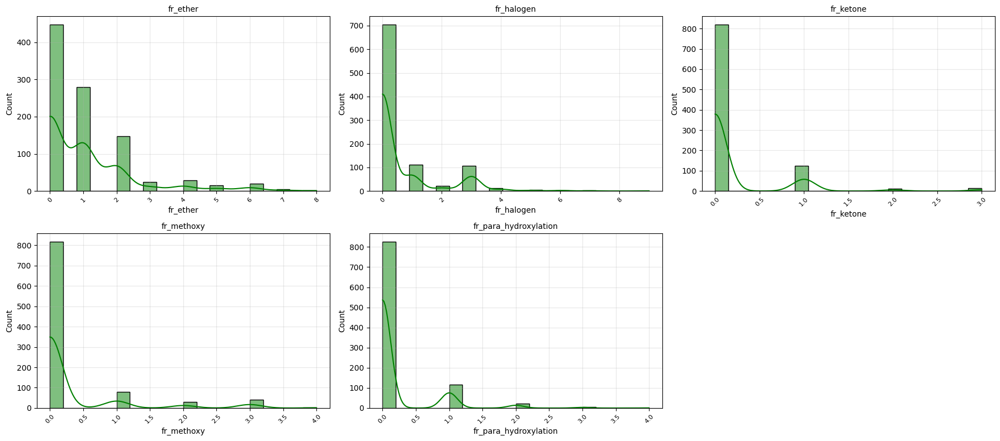

In [23]:
# Разбиваем на группы по 15 признаков
for i in range(0, len(numeric_cols), 15):
    current_cols = numeric_cols[i:i+15]
    n_cols = 3
    n_rows = int(np.ceil(len(current_cols) / n_cols))
    
    plt.figure(figsize=(18, 4 * n_rows))
    
    for j, col in enumerate(current_cols, 1):
        plt.subplot(n_rows, n_cols, j)
        sns.histplot(data_cleaned[col], kde=True, color='green', bins=20)
        plt.title(f"{col}", fontsize=10)
        plt.xticks(rotation=45, fontsize=8)
        plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

Проверим, что таргеты связанны с признаками с нормальной корреляцией

In [24]:
# Улучшенная версия с сохранением важных признаков для каждой целевой переменной

# Создаем словарь для хранения результатов
important_features = {}

for target in targets:
    # Исключаем все другие целевые переменные
    other_targets = [t for t in targets if t != target]
    
    # Получаем список признаков, которые НЕ были отмечены для удаления для данной целевой переменной
    # и исключаем другие целевые переменные
    important_feats = [col for col in data_cleaned.columns 
                      if col not in features_to_remove[target] 
                      and col not in other_targets
                      and col != target]
    
    # Создаем поднабор данных только с важными признаками для этой целевой переменной
    target_df = data_cleaned[important_feats + [target]]
    
    # Рассчитываем корреляции только для важных признаков
    target_corr = target_df.corr(numeric_only=True)[target].drop(target, errors='ignore')
    
    # Сохраняем результаты
    important_features[target] = {
        'dataframe': target_df,
        'features': important_feats,
        'correlations': target_corr.sort_values(key=abs, ascending=False),
        'num_features': len(important_feats)
    }
    
    # Сохраняем датасет в файл
    target_df.to_csv(f'important_features_for_{target.replace(", ", "_")}.csv', index=False)

# Выводим сводную информацию
print("Результаты отбора важных признаков (исключая другие целевые переменные):")
for target in targets:
    print(f"\nДля '{target}':")
    print(f"Количество важных признаков: {important_features[target]['num_features']}")
    print("Топ-5 наиболее коррелированных признаков:")
    print(important_features[target]['correlations'].head().to_string())
    print(f"Датасет сохранен в: important_features_for_{target.replace(', ', '_')}.csv")

# Дополнительный анализ: общие важные признаки для всех целей (исключая сами целевые переменные)
common_important = set(important_features[targets[0]]['features'])
for target in targets[1:]:
    common_important.intersection_update(important_features[target]['features'])
    
print("\nПризнаки, важные для всех целевых переменных (исключая сами целевые переменные):")
print(common_important)

# Сохраняем датасет с общими важными признаками
if common_important:
    common_df = data_cleaned[list(common_important) + targets]
    common_df.to_csv('common_important_features.csv', index=False)
    print("\nДатасет с общими важными признаками сохранен в common_important_features.csv")

Результаты отбора важных признаков (исключая другие целевые переменные):

Для 'IC50, mM':
Количество важных признаков: 140
Топ-5 наиболее коррелированных признаков:
VSA_EState4   -0.264838
Chi2n         -0.252477
PEOE_VSA7     -0.249386
Chi2v         -0.244996
Chi4v         -0.238554
Датасет сохранен в: important_features_for_IC50_mM.csv

Для 'CC50, mM':
Количество важных признаков: 140
Топ-5 наиболее коррелированных признаков:
MolMR        -0.312279
LabuteASA    -0.312227
MolWt        -0.310567
ExactMolWt   -0.310507
Chi0         -0.309054
Датасет сохранен в: important_features_for_CC50_mM.csv

Для 'SI':
Количество важных признаков: 125
Топ-5 наиболее коррелированных признаков:
BalabanJ            0.168786
RingCount          -0.127824
VSA_EState4         0.091061
FpDensityMorgan1    0.087432
VSA_EState6        -0.085104
Датасет сохранен в: important_features_for_SI.csv

Признаки, важные для всех целевых переменных (исключая сами целевые переменные):
{'FpDensityMorgan3', 'VSA_EState2',

# Итоговый анализ молекулярных данных и корреляций

## Основные результаты

### Корреляционный анализ
- **Слабая линейная зависимость** между дескрипторами и целевыми переменными:
  - Максимальная корреляция (IC50-CC50): 0.517 (умеренная)
  - Корреляции с SI <0.2 (очень слабые)
- **Ключевые корреляции**:
  - IC50/CC50: FpDensityMorgan1-2 (0.22-0.29), BalabanJ (0.18)
  - SI: fr_NH2 (0.17)

### Химическая интерпретация
1. **Структура-активность**:
   - Традиционные дескрипторы объясняют <30% вариативности
   - Топологические индексы (BalabanJ, Chi-серии) наиболее информативны
   - NH2-группы слабо коррелируют с селективностью

2. **Проблемные зоны**:
   - 99.7% записей содержали аномалии
   - Дескрипторы VSA_EState и PEOE_VSA показали высокую аномальность
   - SI практически не объясняется имеющимися признаками

## Рекомендации

### Для моделирования
- **IC50/CC50**:
  - Ансамблевые методы (XGBoost, Random Forest)
  - Учет нелинейных зависимостей
  - Фокус на паре IC50-CC50

- **SI**:
  - Альтернативные подходы (кластеризация)
  - Дополнительные данные о функциональных группах

### Перспективные направления
1. **Улучшение данных**:
   - Создание комплексных признаков
   - Применение PCA для снижения размерности

2. **Методология**:
   - Графовые нейросети для анализа структур
   - Методы объяснимого ИИ (SHAP, LIME)

3. **Эксперимент**:
   - Приоритезация соединений с NH2-группами
   - Верификация роли топологических индексов

## Заключение
Данные демонстрируют сложные нелинейные зависимости, требующие:
- Тщательной предобработки (аномалии в 99.7% случаев)
- Нетрадиционных подходов к моделированию
- Интеграции химических знаний в feature engineering

Наибольший прогностический потенциал обнаружен для пары IC50-CC50, тогда как SI требует принципиально новых подходов или дополнительных данных.